# Inference from Baseline Model

- check the cross validation score 
- create submit csv file

## Import 

In [2]:
import os
import warnings
import random
from pprint import pprint
import copy
from typing import List, Tuple
import glob
import json
import csv
# import dataclasses
from joblib import Parallel, delayed

from tqdm import tqdm
import numpy as np
import pandas as pd
from box import Box, from_file
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from scipy.optimize import minimize
from sklearn.metrics import jaccard_score
import cv2
import seaborn as sns
from trimesh.voxel.runlength import dense_to_brle

import torch
print(torch.__version__)
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2
from timm import create_model
import segmentation_models_pytorch as smp
# from torchmetrics import FBetaScore
import ttach as tta

import pytorch_lightning as pl
print(pl.__version__)
from pytorch_lightning.utilities.seed import seed_everything
from pytorch_lightning import LightningDataModule, LightningModule


warnings.filterwarnings("ignore")

torch.autograd.set_detect_anomaly(True)
pd.options.display.max_colwidth = 250
pd.options.display.max_rows = 30

# インライン表示
%matplotlib inline

/home/ss/anaconda3/envs/wildfire/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


1.10.1+cu113
1.6.0


## Condig

In [3]:
from typing import List, Set, Dict, Any


class CFG(object):
    # basic
    debug: bool = False
    debug_sample: int = 64
    folds: int  = 1 # num inference ensemble 
    seed: int   = 417
    eps: float  = 1e-12
    
    SINGLE_FOLD = True
    
    # data
    PATH_CSV: str  =  f'../data/002_Full+California/002_seed417.csv'
    
    BATCH_SIZE = 8
    val_loader :Dict[str, Any]= {
        'batch_size': BATCH_SIZE*2,
        'shuffle': False,
        'num_workers': 8,
        'pin_memory': False,
        'drop_last': False
    }
    
    # Path to experiment `group` name folder + `runame` folder
    PATH_MODEL_ROOT:str = 'output/V1/A6000_V1_hrnet_w30BC16TH0.4_LR0.001T0100MIX0.5B32_fl-tr/A6000_fold0'
    
    # this target fold
    fold:int = 0
    
    preprocess: Dict = {
        "input_size": 512,
    }
    
    outdir = f'output/inference/003/'
    os.makedirs(outdir, exist_ok=True)


# box
cfg = Box({k:v for k, v in dict(vars(CFG)).items() if '__' not in k})
    
# 乱数のシードを設定
seed_everything(cfg.seed)
torch.manual_seed(cfg.seed)
np.random.seed(cfg.seed)
random.seed(cfg.seed)
    
pprint(cfg)

Global seed set to 417


{'BATCH_SIZE': 8,
 'PATH_CSV': '../data/002_Full+California/002_seed417.csv',
 'PATH_MODEL_ROOT': 'output/V1/A6000_V1_hrnet_w30BC16TH0.4_LR0.001T0100MIX0.5B32_fl-tr/A6000_fold0',
 'SINGLE_FOLD': True,
 'debug': False,
 'debug_sample': 64,
 'eps': 1e-12,
 'fold': 0,
 'folds': 1,
 'outdir': 'output/inference/003/',
 'preprocess': Box({'input_size': 512}),
 'seed': 417,
 'val_loader': {'batch_size': 16,
                'drop_last': False,
                'num_workers': 8,
                'pin_memory': False,
                'shuffle': False}}


## Augmentation

In [4]:
# augmentation
tf_dict = {
    'val': A.Compose(
        [
            A.Resize(cfg.preprocess.input_size, cfg.preprocess.input_size),
            ToTensorV2(),
        ]
    ),
}

cfg.augmentation = str(tf_dict).replace('\n', '').replace(' ', '')
pprint(cfg.augmentation)

"{'val':Compose([Resize(always_apply=False,p=1,height=512,width=512,interpolation=1),ToTensorV2(always_apply=True,p=1.0,transpose_mask=False),],p=1.0,bbox_params=None,keypoint_params=None,additional_targets={})}"


## Dataset

In [5]:
df = pd.read_csv(cfg.PATH_CSV)
df = df[df['defects'] == False]
df = df[df['fold'] != -1]
df.sample(4)

,name,feature,mask,defects,fold,hight,width,california,cv
1925,edc26d10-4a59-495b-8176-543e46c5cfdd_5,../data/002_Full+California/img/edc26d10-4a59-495b-8176-543e46c5cfdd_5.npy,../data/002_Full+California/ann/edc26d10-4a59-495b-8176-543e46c5cfdd_5.npy,False,0,512,512,False,1
1781,a644541a-0d52-4bc8-9c30-5a6b4270dbfa_0,../data/002_Full+California/img/a644541a-0d52-4bc8-9c30-5a6b4270dbfa_0.npy,../data/002_Full+California/ann/a644541a-0d52-4bc8-9c30-5a6b4270dbfa_0.npy,False,1,512,512,False,1
1456,0d30a00f-208f-4c9e-9aed-676527463854_1,../data/002_Full+California/img/0d30a00f-208f-4c9e-9aed-676527463854_1.npy,../data/002_Full+California/ann/0d30a00f-208f-4c9e-9aed-676527463854_1.npy,False,2,512,512,False,1
1659,7df7928f-4807-4a89-8f98-826be7b7dc4d_0,../data/002_Full+California/img/7df7928f-4807-4a89-8f98-826be7b7dc4d_0.npy,../data/002_Full+California/ann/7df7928f-4807-4a89-8f98-826be7b7dc4d_0.npy,False,3,512,512,False,0


######## Phase val Num sample: 356


  0%|          | 0/23 [00:00<?, ?it/s]

torch.Size([16, 24, 512, 512]) torch.Size([16, 512, 512])


  0%|          | 0/23 [00:05<?, ?it/s]


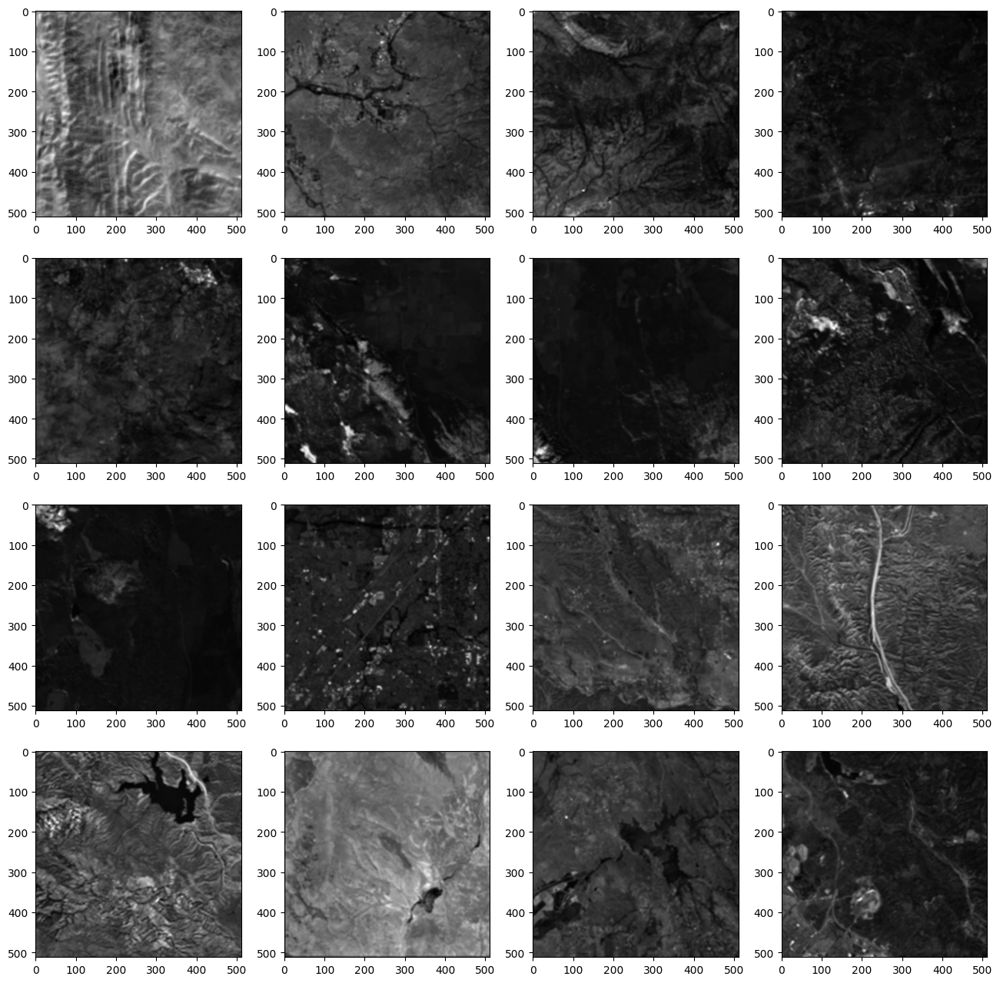

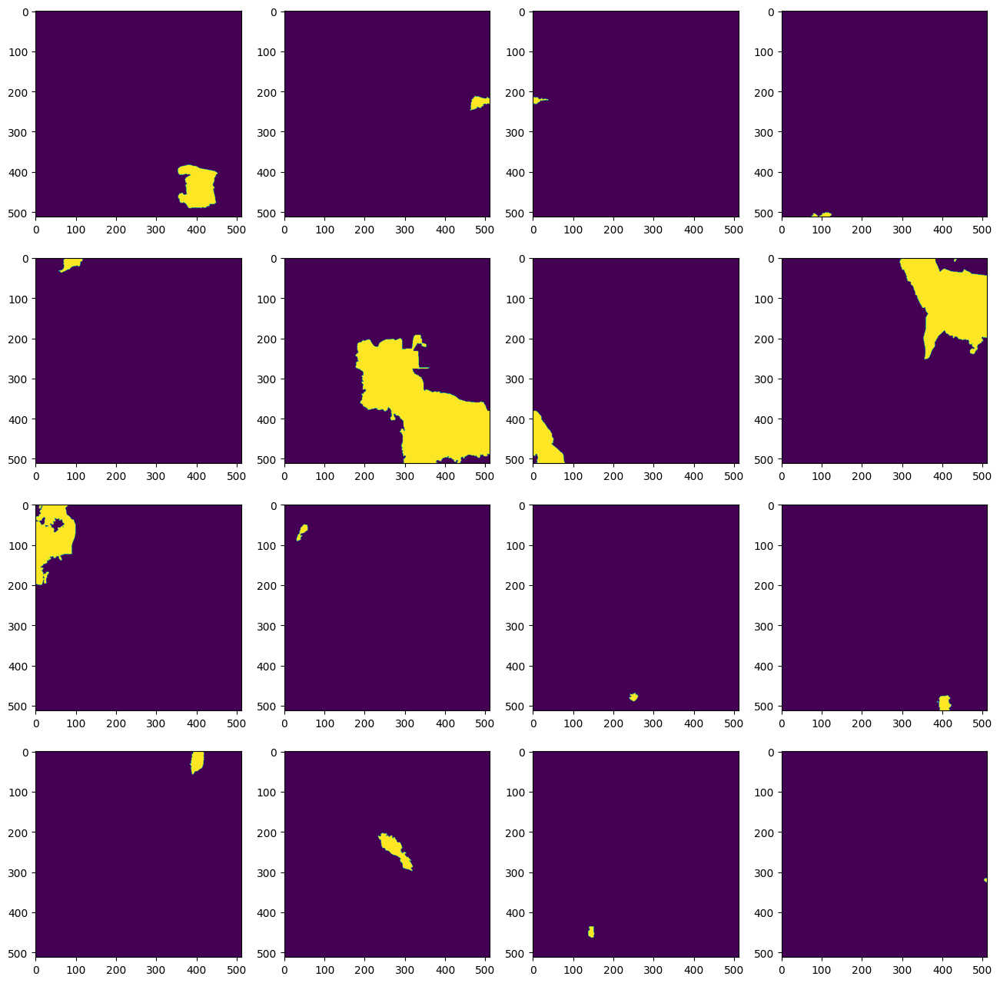

In [6]:
class FireDataset(Dataset):
    def __init__(self,
                 df,
                 phase: str,
                 ):
        self.df = df
        self.phase = phase
        self.transform = tf_dict[self.phase]
        print(f"######## Phase {phase} Num sample:", len(self.df))

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):
        row = self.df.iloc[index]
        
        PATH_FEAT = row.feature
        img = np.load(PATH_FEAT).astype(np.float32)
        
        if row.defects:
            # for consistant loss
            mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.float32)
        else:
            PATH_MASK = row['mask']
            mask = np.load(PATH_MASK).astype(np.float32)
        
        # augmentation
        transformed = self.transform(image=img, mask=mask)
        
        img, mask = transformed["image"], transformed["mask"]
        return img, mask
    
class FireModule(LightningDataModule):
    def __init__(
        self,
        df_train,
        df_valid,
        cfg,
    ):
        super().__init__()
        self._cfg = cfg
        self.df_train = df_train
        self.df_valid = df_valid

    def train_dataloader(self):
        dataset = FireDataset(self.df_train, phase='train')
        return DataLoader(dataset, **self._cfg.train_loader)

    def val_dataloader(self):
        dataset = FireDataset(self.df_valid, phase='val')
        return DataLoader(dataset, **self._cfg.val_loader)


sample_dataloader = FireModule(df, df, cfg).val_dataloader()
for (imgs, masks) in tqdm(sample_dataloader):
    # is in positive
    print(imgs.shape, masks.shape)
    break

num = 16

os.makedirs(os.path.join(cfg.outdir, 'artifact'), exist_ok=True)

plt.figure(figsize=(16, 16), facecolor='white')
for it, img in enumerate(imgs[:num]):
    plt.subplot(4, 4, it+1)
    plt.imshow(img[0].numpy(), cmap='gray')
    
    # plt.axis('off')
plt.savefig(os.path.join(cfg.outdir, 'artifact', f'003_image_visualize_tiles.png'))
plt.show();

plt.figure(figsize=(16, 16), facecolor='white')
for it, mask in enumerate(masks[:num]):
    plt.subplot(4, 4, it+1)
    plt.imshow(mask.numpy())
plt.savefig(os.path.join(cfg.outdir, 'artifact', f'003_mask_visualize_tiles.png'))
plt.show();

plt.clf()
plt.close()

## Model

In [9]:
from utils.models import TimmUnet

class FireModel(LightningModule):
    def __init__(self, cfg):
        super().__init__()
        self.cfg = cfg
        self.__build_model()
        
    def __build_model(self):
        self.backbone = TimmUnet(
            **self.cfg.model.timmunet,
            )

    def forward(self, x):
        feat = self.backbone(x)
        return feat.squeeze(1)

## Test Loading

In [10]:
# configuration
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
fold = cfg.fold

# test load 
PATH_MODEL_ROOT = cfg.PATH_MODEL_ROOT
PATH_MODEL = f'{PATH_MODEL_ROOT}/iou_fold{fold}.ckpt'
PATH_CFG   = f'{PATH_MODEL_ROOT}/cfg.json'

print(PATH_MODEL, PATH_CFG, '\n')


# restore
inf_cfg = from_file.box_from_file(PATH_CFG)
model = FireModel.load_from_checkpoint(PATH_MODEL, cfg=inf_cfg)
model.eval()
model = model.to(device)

print(f'EVALUATE FOLD: {fold} DEVICE: {device}\n WEIGHT: {PATH_MODEL_ROOT}')

# output
save_preds_dir = f'{PATH_MODEL_ROOT}/submit/visualize/'
os.makedirs(save_preds_dir, exist_ok=True)

output/V1/A6000_V1_hrnet_w30BC16TH0.4_LR0.001T0100MIX0.5B32_fl-tr/A6000_fold0/iou_fold0.ckpt output/V1/A6000_V1_hrnet_w30BC16TH0.4_LR0.001T0100MIX0.5B32_fl-tr/A6000_fold0/cfg.json 

EVALUATE FOLD: 0 DEVICE: cuda:0
 WEIGHT: output/V1/A6000_V1_hrnet_w30BC16TH0.4_LR0.001T0100MIX0.5B32_fl-tr/A6000_fold0


## Inference with Optimizing Threshold

In [16]:
thresholds = []
results = []

def compute_submission_mask(id: str, mask):
    """
    official submission format
        refer from: https://huggingface.co/datasets/chabud-team/chabud-ecml-pkdd2023/blob/main/create_sample_submission.py
    """
    brle = dense_to_brle(mask.astype(bool).flatten())
    return {"id": id, "rle_mask": brle, "index": np.arange(len(brle))}

## only 0 fold
for fold in range(cfg.folds):
    
    # fold setting
    PATH_MODEL_ROOT = cfg.PATH_MODEL_ROOT
    PATH_MODEL = f'{PATH_MODEL_ROOT}/iou_fold{fold}.ckpt'
    PATH_CFG   = f'{PATH_MODEL_ROOT}/cfg.json'
    print(PATH_MODEL, PATH_CFG, '\n')
    

    # output
    save_preds_dir = f'{PATH_MODEL_ROOT}/submit/visualize/'
    os.makedirs(save_preds_dir, exist_ok=True)
    
    # model
    cfg_inf = from_file.box_from_file(PATH_CFG)
    model = FireModel.load_from_checkpoint(PATH_MODEL, cfg=cfg_inf)
    model.eval()
    if cfg.debug:
        device = torch.device('cpu')

    model = model.to(device)
    print(f'{device=}')
    
    # TTA
    # model = tta.SegmentationTTAWrapper(model, tta.aliases.d4_transform(), merge_mode='mean')
    
    ###################################
    ##### Official `fold` setting #####
    ###################################
    val_df = df[df['fold'] == 0].reset_index(drop=True)
    
    ds_val = FireDataset(val_df, phase='val')
    cfg_inf.val_loader.batch_size = 1
    dl_val = DataLoader(ds_val, **cfg_inf.val_loader)
    
    running_tp = []
    running_fp = []
    running_fn = []
    running_union = []
    running_iou = []
    filenames = []
    precisions = []
    recalls = []
    f1s = []
    ious = []
    positives = []
    count = 0
    
    print(f'#'*60)
    print(f'### Fold: {fold}')
    print(f'#'*60)
    print(f'### Start Inference')


    for i, (images, labels) in enumerate(dl_val):
        current_image_filename = df.iloc[i]['name']
        print("###### Evaluating: ", f'{i}/{len(ds_val)}', os.path.basename(current_image_filename))
        
        # cuda
        images = images.to(device)
        images = images.float()

        # inference
        with torch.no_grad():
            
            outputs = model(images)
            outputs = torch.sigmoid(outputs) # B, H, W
        
        outputs = outputs.cpu().numpy()
        images = images.cpu().numpy()
        
        # Allocate False Color
        preimg, postimg = images[0, 3+12:6+12, :, :], images[0, 3:6, :, :] # B, C:24, H, W
        fire = labels[0].cpu().numpy() # B, H, W
        outputs = outputs[0, :, :] # H, W
        
        # min max normalization for png images
        preimg_ = (preimg - preimg.min()) / (preimg.max() - preimg.min())
        postimg_ = (postimg - postimg.min()) / (postimg.max() - postimg.min())
        fire_ = np.clip(fire, a_min=0, a_max=1)
        output_ = np.clip(outputs, a_min=0, a_max=1)
            
        # save image
        preimg_ = (preimg_ * 255).astype(np.uint8).transpose(1, 2, 0)
        postimg_ = (postimg_ * 255).astype(np.uint8).transpose(1, 2, 0)
        fire_ = (fire_ * 255).astype(np.uint8)
        output_ = (output_ * 255).astype(np.uint8)
        
        # save image
        cv2.imwrite(f'{save_preds_dir}/{os.path.basename(current_image_filename)}_pre.png', preimg_)
        cv2.imwrite(f'{save_preds_dir}/{os.path.basename(current_image_filename)}_post.png', postimg_)
        cv2.imwrite(f'{save_preds_dir}/{os.path.basename(current_image_filename)}_fire.png', fire_)
        cv2.imwrite(f'{save_preds_dir}/{os.path.basename(current_image_filename)}_output.png', output_)
        del preimg_, postimg_, fire_, output_
        
        # submit
        outputs_bin = (outputs >= cfg_inf.model.threshold).astype(bool)
        cv2.imwrite(
            f'{save_preds_dir}/{os.path.basename(current_image_filename)}_output_bin.png', 
            (outputs_bin.astype(np.uint8))*255)
        submit_dict = compute_submission_mask(current_image_filename, outputs_bin)
        results.append(pd.DataFrame(submit_dict))
            
        # metrics
        gt = fire.copy()
        prediction = outputs.copy()

        tp = np.rint(prediction * gt)
        fp = np.rint(prediction - tp)
        fn = np.rint(gt - tp)
        union = np.rint(np.sum(prediction + gt - tp))

        iou = np.sum(tp) / np.sum((prediction + gt - tp + 0.00001))
        tp = np.sum(tp).astype(int)
        fp = np.sum(fp).astype(int)
        fn = np.sum(fn).astype(int)
        
        precision = tp / (tp + fp + 0.00001)
        recall = tp / (tp + fn + 0.00001)
        f1 = 2 * precision * recall / (precision + recall + 0.00001)
        
        running_tp.append(tp)
        running_fp.append(fp)
        running_fn.append(fn)
        running_union.append(union)
        running_iou.append(iou)
        
        precisions.append(precision)
        recalls.append(recall)
        f1s.append(f1)
        ious.append(iou)
        
        if np.max(fire) < 0.5:
            positives.append(False)
        else:
            positives.append(True)
        
        count += 1
        

        # optimize threshold
        def _opt(x):
            return -jaccard_score(fire, outputs >= x, average='micro') 
        
        result = minimize(_opt, x0=np.array([0.45]), method='Powell', tol=1e-2)
        best_th = result['x'].item()
        thresholds.append(best_th)   
        # early exit
        if cfg.debug and i > 2:
            break
        
    running_tp = np.array(running_tp)
    running_fp = np.array(running_fp)
    running_fn = np.array(running_fn)
    running_union = np.array(running_union)
    running_iou = np.array(running_iou)
    precisions = np.array(precisions)
    recalls = np.array(recalls)
    f1s = np.array(f1s)
    ious = np.array(ious)
    
    
    
    # foldout metrics
    print()
    val_df[f'tp'] = running_tp
    val_df[f'fp'] = running_fp
    val_df[f'fn'] = running_fn
    precision = running_tp / (running_tp + running_fp + 0.00001)
    recall = running_tp / (running_tp + running_fn + 0.00001)
    f1 = 2 * (precision * recall) / (precision + recall + 0.00001)
    iou = running_tp / (running_union + 0.00001)
    print("  precision: ", precision.mean())
    val_df[f'precision'] = precision
    print("  recall: ", recall.mean())
    val_df[f'recall'] = recall
    print("  f1: ", f1.mean())
    val_df[f'f1'] = f1
    print("  iou: ", iou.mean())
    val_df[f'iou'] = iou
    
    val_df[f'threshold'] = thresholds
    print(" threshold: ", np.mean(thresholds))
    val_df[f'positive'] = positives

    val_df.to_csv(f'{PATH_MODEL_ROOT}/submit/oof_official_fold{fold}_threshold{cfg_inf.model.threshold}.csv', index=False, header=True)
    
    if cfg.SINGLE_FOLD:
        break
    
# concatenate all dataframes
submission_df = pd.concat(results)
submission_df.to_csv(f'{PATH_MODEL_ROOT}/submit/predictions_003_single_model.csv', index=False)
    

output/V1/A6000_V1_hrnet_w30BC16TH0.4_LR0.001T0100MIX0.5B32_fl-tr/A6000_fold0/iou_fold0.ckpt output/V1/A6000_V1_hrnet_w30BC16TH0.4_LR0.001T0100MIX0.5B32_fl-tr/A6000_fold0/cfg.json 

device=device(type='cuda', index=0)
######## Phase val Num sample: 78
############################################################
### Fold: 0
############################################################
### Start Inference
###### Evaluating:  0/78 012b8863-976c-44e1-a491-9adf19c1cbba_0
###### Evaluating:  1/78 0328d12a-4ad8-4504-8ac5-70089db10b4e_0
###### Evaluating:  2/78 0328d12a-4ad8-4504-8ac5-70089db10b4e_1
###### Evaluating:  3/78 03790d1a-5b9c-48ed-820d-83abbe656035_0
###### Evaluating:  4/78 03790d1a-5b9c-48ed-820d-83abbe656035_1
###### Evaluating:  5/78 039885ad-e4f2-461e-9784-60508d0a7ab5_0
###### Evaluating:  6/78 039885ad-e4f2-461e-9784-60508d0a7ab5_1
###### Evaluating:  7/78 039885ad-e4f2-461e-9784-60508d0a7ab5_2
###### Evaluating:  8/78 039885ad-e4f2-461e-9784-60508d0a7ab5_3
###### Evaluating:

## Analysis

threshold mean: -0.02036512952374692
thresh hold mean: 0.3527854612813534


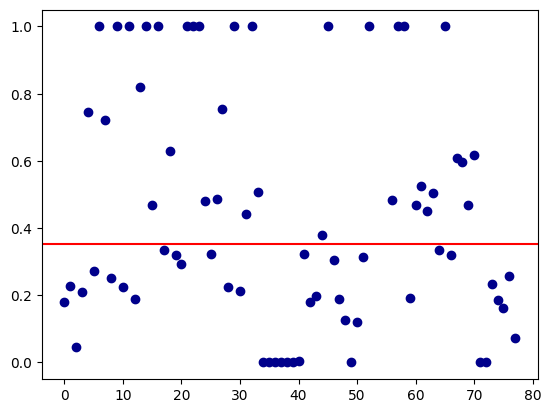

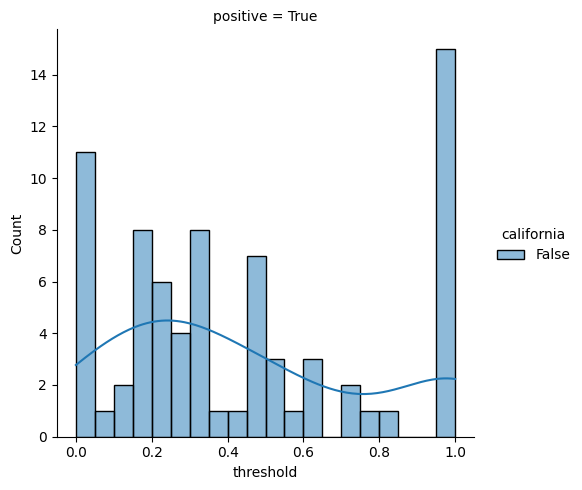

In [75]:
col = 'threshold'
plt.scatter(x=val_df.index, y=val_df[col], c='DarkBlue')
mean_th = val_df[col].values.mean()
print(f'threshold mean: {mean_th}')

plt.axhline(y=mean_th, xmin=0, xmax=len(val_df))
plt.savefig(f'{PATH_MODEL_ROOT}/submit/threshold_all_fold{fold}.png')
# plt.show();
plt.clf()
plt.close()

val_df[col] = np.clip(val_df[col].values, a_min=0, a_max=1)

# normal values
val_pos_df = val_df[val_df['positive'] == True]
bet_th = val_pos_df[(val_pos_df[col] < 1.0) & (val_pos_df[col] > 0.)]
mean_th = bet_th[col].values.mean()
print(f'thresh hold mean: {mean_th}')

plt.scatter(x=val_pos_df.index, y=np.clip(val_pos_df[col].values, a_min=0, a_max=1), c='DarkBlue')
plt.axhline(y=mean_th, xmin=0, xmax=len(bet_th), color='r')
plt.savefig(f'{PATH_MODEL_ROOT}/submit/threshold_better_fold{fold}.png')
plt.show();
plt.clf()
plt.close()

sns.displot(data=val_pos_df, x="threshold", col="positive", hue='california', kde=True, bins=20)

for col in ['precision', 'recall', 'f1', 'iou']:
    for col_v in ['precision', 'recall', 'f1', 'iou']:
        if col == col_v:
            continue
        sns.displot(data=val_pos_df, x=col, y=col_v, kind='kde', rug=True)
        
        plt.savefig(f'{PATH_MODEL_ROOT}/submit/dist{col}-{col_v}_fold{fold}_2d.png')
        # plt.show();
        plt.clf()
        plt.close()
    sns.displot(data=val_pos_df, x=col, kde=True, bins=20, color='tomato')
    plt.savefig(f'{PATH_MODEL_ROOT}/submit/dist_{col}_fold{fold}.png')
    # plt.show();
    plt.clf()
    plt.close()

In [76]:
val_pos_df = val_df[val_df['positive'] == True]
val_pos_df.head()

,name,feature,mask,defects,fold,hight,width,california,cv,tp,fp,fn,precision,recall,f1,iou,threshold,positive
0,0ff249de-784d-4760-a039-ed9f92eca60c_0,../data/002_Full+California/img/0ff249de-784d-4760-a039-ed9f92eca60c_0.npy,../data/002_Full+California/ann/0ff249de-784d-4760-a039-ed9f92eca60c_0.npy,False,0,512,512,False,1,2611,9175,1914,0.221534,0.577017,0.320148,0.191478,0.179859,True
1,0ff249de-784d-4760-a039-ed9f92eca60c_1,../data/002_Full+California/img/0ff249de-784d-4760-a039-ed9f92eca60c_1.npy,../data/002_Full+California/ann/0ff249de-784d-4760-a039-ed9f92eca60c_1.npy,False,0,512,512,False,1,56801,1466,6724,0.974840,0.894152,0.932749,0.990773,0.226400,True
2,0ff249de-784d-4760-a039-ed9f92eca60c_2,../data/002_Full+California/img/0ff249de-784d-4760-a039-ed9f92eca60c_2.npy,../data/002_Full+California/ann/0ff249de-784d-4760-a039-ed9f92eca60c_2.npy,False,0,512,512,False,2,480,0,2495,1.000000,0.161345,0.277856,0.125392,0.046753,True
3,1087ccdb-44af-4043-845c-d79e00fef8bc_0,../data/002_Full+California/img/1087ccdb-44af-4043-845c-d79e00fef8bc_0.npy,../data/002_Full+California/ann/1087ccdb-44af-4043-845c-d79e00fef8bc_0.npy,False,0,512,512,False,2,4032,144,3390,0.965517,0.543250,0.695288,0.467045,0.209255,True
4,270908a1-a110-4167-896e-bc0a847b3d31_0,../data/002_Full+California/img/270908a1-a110-4167-896e-bc0a847b3d31_0.npy,../data/002_Full+California/ann/270908a1-a110-4167-896e-bc0a847b3d31_0.npy,False,0,512,512,False,3,303,474,2,0.389961,0.993443,0.560070,0.252290,0.744886,True


In [77]:
# Only positive data
iou_positive_zero_score = val_pos_df['iou'].values.mean()
iou_positive_zero_score

0.49039666910076923

In [78]:
# Negative data values -> 0
iou_positive_zero_score = val_df['iou'].values.mean()
iou_positive_zero_score

0.4715352587507394

In [79]:
# Negative data values -> 1
val_df.loc[val_df['iou'] == 0.0, 'iou'] = 1
val_df['iou'].values.mean()
iou_positive_one_score = val_df['iou'].values.mean()
iou_positive_one_score

0.7279455151609958

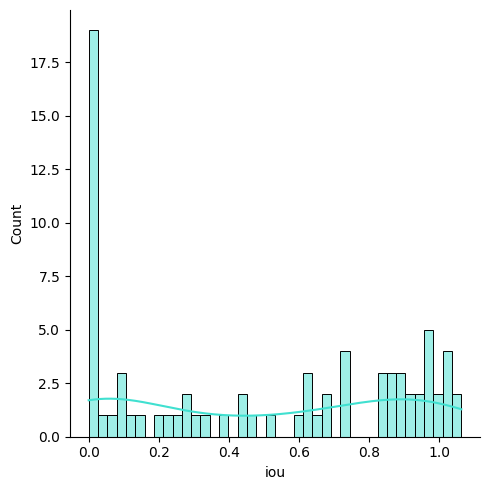

In [84]:
sns.displot(data=val_pos_df, x='iou', kde=True, bins=40, color='turquoise')
plt.savefig(f'{PATH_MODEL_ROOT}/submit/dist_{col}.png')
plt.show();
plt.clf()
plt.close()

## Missing `uuid`

In [99]:
TOP_N = 16
df_error = val_pos_df.sort_values(by=['iou','name'], ascending=[True, True,],)
df_error_top = df_error[:TOP_N]
df_error_top[['iou', 'name']]

,iou,name
6,0.0,35579f9f-0a51-459b-9dab-299f2c2b0b75_0
9,0.0,497f80b4-878a-4f97-9522-5edcd5229dfb_1
11,0.0,49f0aa55-5bcd-41c2-9acd-8d50ff884db7_0
14,0.0,69ab9dd2-7c42-45e4-a315-4239296fa5d8_0
16,0.0,75dc4de0-cbc7-4e3c-bab0-63b65e7e0d4b_0
21,0.0,83412491-7fc5-4b5a-b23d-157623d9fda1_2
22,0.0,83b6ccdb-abe8-49af-815e-c8c2fa89a505_0
23,0.0,83b6ccdb-abe8-49af-815e-c8c2fa89a505_1
29,0.0,ab6f4126-eb07-4337-a691-68571e042471_0
32,0.0,adc21d31-1ed9-4466-8d1d-91cf03e1c7c9_10


######## Phase val Num sample: 16


100%|██████████| 1/1 [00:01<00:00,  1.61s/it]

torch.Size([16, 24, 512, 512]) torch.Size([16, 512, 512])


100%|██████████| 1/1 [00:01<00:00,  1.81s/it]


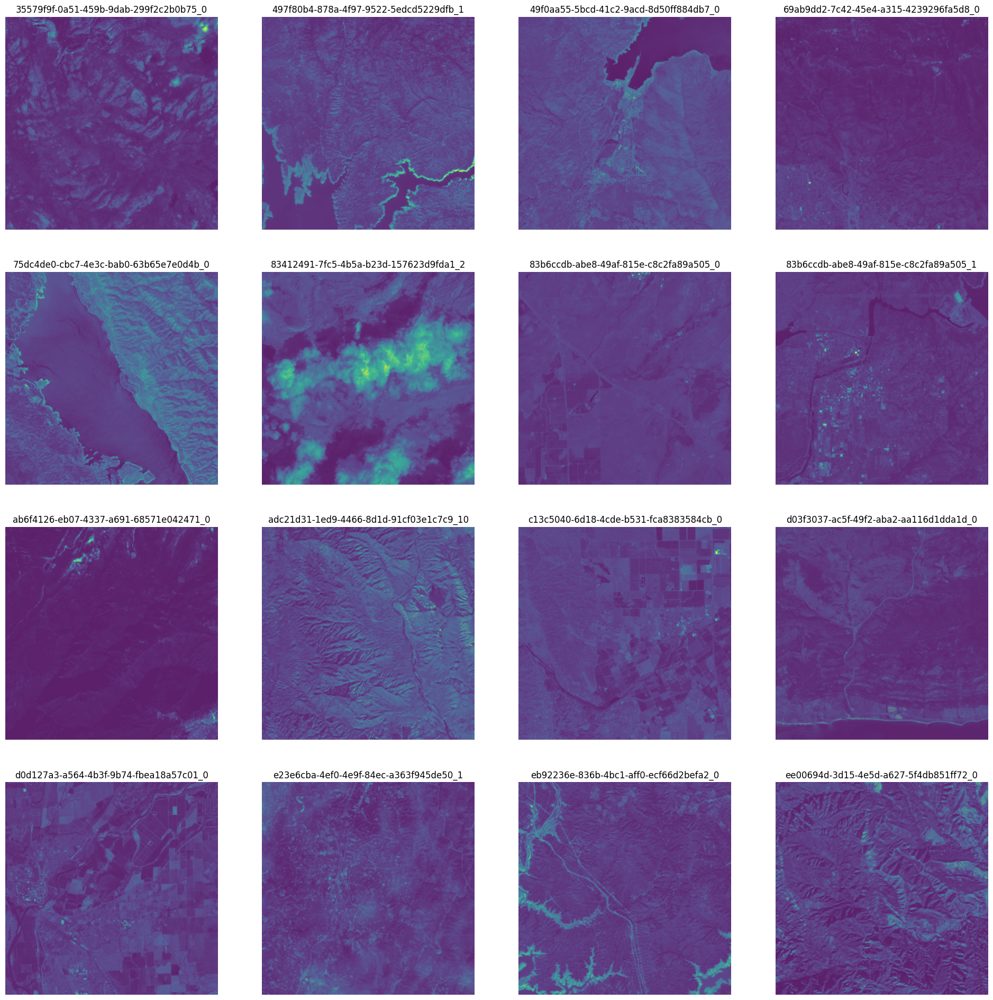

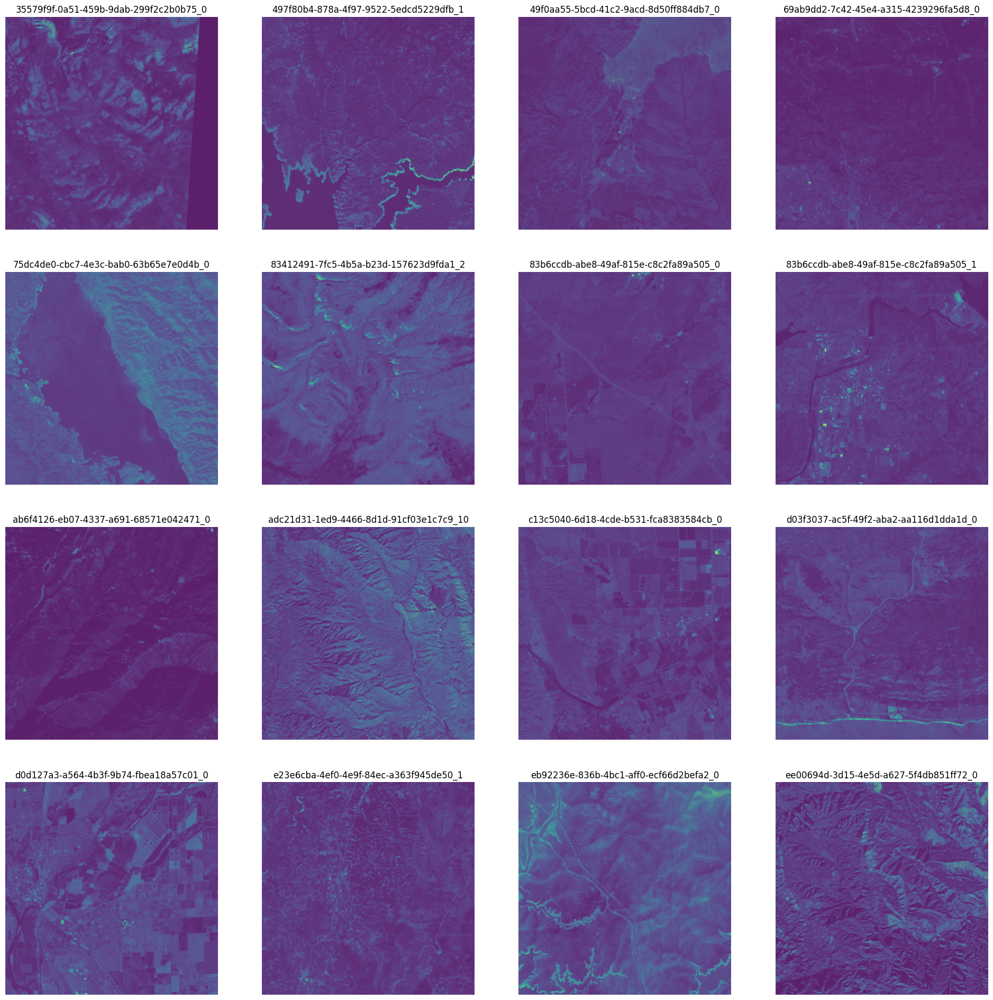

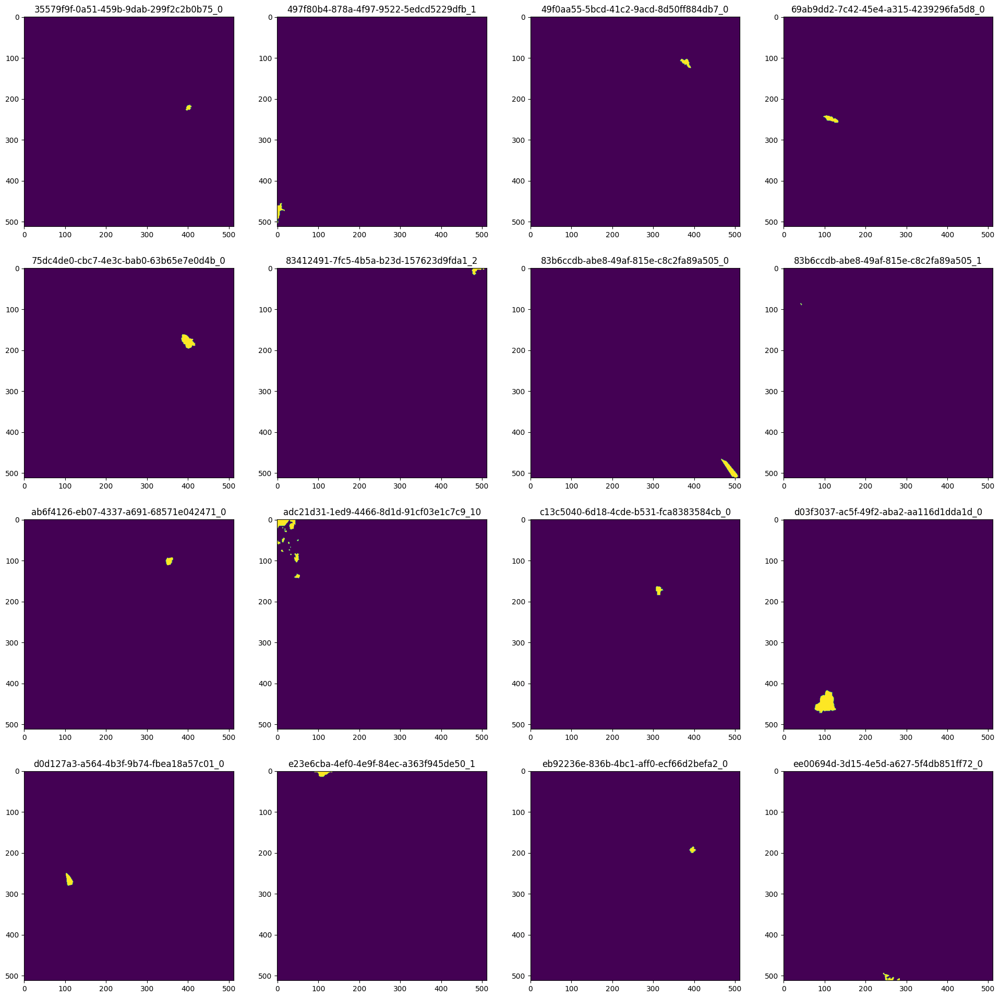

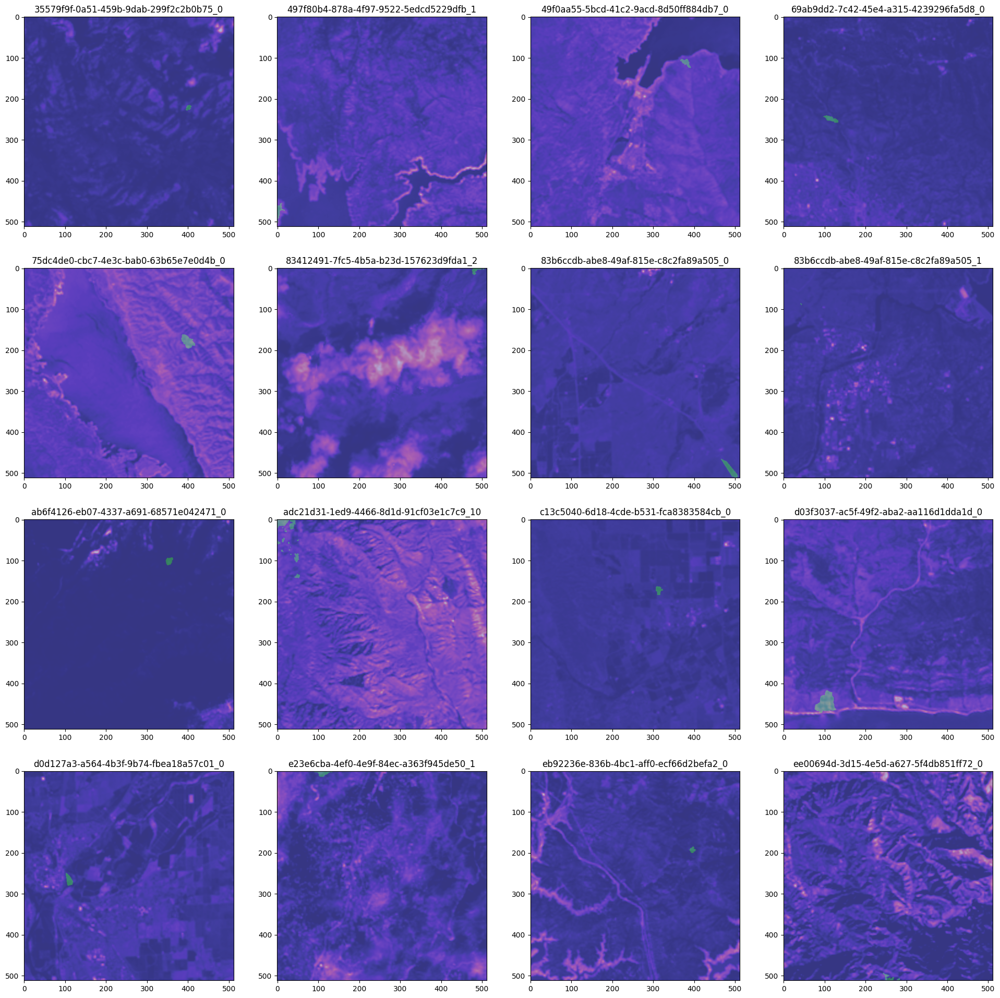

In [112]:
sample_dataloader = FireModule(df_error_top, df_error_top, cfg).val_dataloader()
for (imgs, masks) in tqdm(sample_dataloader):
    # is in positive
    print(imgs.shape, masks.shape)

os.makedirs(os.path.join(cfg.outdir, 'artifact'), exist_ok=True)

plt.figure(figsize=(24, 24), facecolor='white')
for it, img in enumerate(imgs):
    plt.subplot(4, 4, it+1)
    uuid = df_error_top.iloc[it]['name']
    plt.title(uuid)
    plt.imshow(img[0].numpy(), alpha=0.5)
    plt.imshow(img[1].numpy(), alpha=0.5)
    plt.imshow(img[2].numpy(), alpha=0.5)
    
    plt.axis('off')
plt.savefig(os.path.join(cfg.outdir, 'artifact', f'003_post_image_visualize_tiles_error.png'))
plt.show();

plt.figure(figsize=(24, 24), facecolor='white')
for it, img in enumerate(imgs):
    plt.subplot(4, 4, it+1)
    uuid = df_error_top.iloc[it]['name']
    plt.title(uuid)
    plt.imshow(img[0 + 12].numpy(), alpha=0.5)
    plt.imshow(img[1 + 12].numpy(), alpha=0.5)
    plt.imshow(img[2 + 12].numpy(), alpha=0.5)
    
    plt.axis('off')
plt.savefig(os.path.join(cfg.outdir, 'artifact', f'003_pre_image_visualize_tiles_error.png'))
plt.show();

plt.figure(figsize=(24, 24), facecolor='white')
for it, mask in enumerate(masks):
    plt.subplot(4, 4, it+1)
    uuid = df_error_top.iloc[it]['name']
    plt.title(uuid)
    plt.imshow(mask.numpy())
plt.savefig(os.path.join(cfg.outdir, 'artifact', f'003_mask_visualize_tiles_error.png'))
plt.show();


plt.figure(figsize=(24, 24), facecolor='white')
for it, (img, mask) in enumerate(zip(imgs, masks)):
    plt.subplot(4, 4, it+1)
    uuid = df_error_top.iloc[it]['name']
    plt.title(uuid)
    plt.imshow(img[0].numpy(), cmap='magma', alpha=0.7)
    plt.imshow(mask.numpy(), cmap='winter', alpha=0.3)
plt.savefig(os.path.join(cfg.outdir, 'artifact', f'003_overlay_visualize_tiles_error.png'))
plt.show();


plt.clf()
plt.close()